## set up notebook

In [73]:
#reload when modified
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [74]:
import svist4get as sv4g
import pandas as pd
from IPython.display import Image, display
from util import *
import os
import re
import tqdm
import pysam

In [75]:
_ABS_PATH = os.path.join('')
_GTF = os.path.join('tb927_5.gtf')
_GENOME = os.path.join('tb927_5.fa')
_FIG_OUT = ''

In [76]:
!ls -l

total 127506
-rw-r--r-- 1 mtinti lsd   518840 Jan  8 10:45 all_927_F_plus_R_SL.bed
-rw-r--r-- 1 mtinti lsd   243420 Jan  8 10:44 all_F_plus_R_PoliA.bed
-rw-r----- 1 mtinti lsd  4260683 Jan  7 17:23 all_pepe.bed
-rw-r--r-- 1 mtinti lsd  1563428 Jan  8 10:48 B_pol_1_sorted_pc_bg.bed
-rw-r--r-- 1 mtinti lsd  1531942 Jan  8 10:44 B_pol_2_sorted_pc_bg.bed
-rw-r--r-- 1 mtinti lsd  1587720 Jan  8 10:48 B_pol_3_sorted_pc_bg.bed
-rw-r--r-- 1 mtinti lsd  1434824 Jan  8 10:45 B_sub_1_sorted_pc_bg.bed
-rw-r--r-- 1 mtinti lsd  1395978 Jan  8 10:43 B_sub_2_sorted_pc_bg.bed
-rw-r--r-- 1 mtinti lsd  1518582 Jan  8 10:47 B_sub_3_sorted_pc_bg.bed
-rw-r--r-- 1 mtinti lsd  1869042 Jan  8 10:46 B_tot_1_sorted_pc_bg.bed
-rw-r--r-- 1 mtinti lsd  1827814 Jan  8 10:47 B_tot_2_sorted_pc_bg.bed
-rw-r--r-- 1 mtinti lsd  1807594 Jan  8 10:42 B_tot_3_sorted_pc_bg.bed
-rw-r----- 1 mtinti lsd 13389850 Jan  8 11:11 Figures_Paper_Coverage.ipynb
-rw-r--r-- 1 mtinti lsd  2401227 Jan  8 11:05 KS17gene_1749a_paper_figures.

In [77]:
bsf_exps = ['B_{exp}_{n}'.format(exp=exp,n=n) for exp in ['tot','pol','sub'] for n in range(1, 4) ]
pcf_exps = ['P_{exp}_{n}'.format(exp=exp,n=n) for exp in ['tot','pol','sub'] for n in range(1, 4) ]

In [78]:
[os.path.join('', '{}_sorted_pc_bg.bed'.format(n)) for n in bsf_exps] 

['B_tot_1_sorted_pc_bg.bed',
 'B_tot_2_sorted_pc_bg.bed',
 'B_tot_3_sorted_pc_bg.bed',
 'B_pol_1_sorted_pc_bg.bed',
 'B_pol_2_sorted_pc_bg.bed',
 'B_pol_3_sorted_pc_bg.bed',
 'B_sub_1_sorted_pc_bg.bed',
 'B_sub_2_sorted_pc_bg.bed',
 'B_sub_3_sorted_pc_bg.bed']

## define viz

In [56]:
#configure dictionary to store figure setup
exp_dict = {
    
    'paper_figures':dict(
        path_to_config=os.path.join('svist4getConf','svist4get_data','A4_p2.cfg'),
        gtf_file=  os.path.join(_GTF),
        fasta_file= os.path.join(_GENOME),
        bedgraph_label = ['BS-'+n for n in ['TOT1','TOT2','TOT3']+['POL1','POL2','POL3']+['SUB1','SUB2','SUB3']]+
        ['PC-'+n for n in ['TOT1','TOT2','TOT3']+['POL1','POL2','POL3']+['SUB1','SUB2','SUB3']]+
        ['SL','PA']+['RiboBSF','RiboPCF']+['PEP-new','PEP-all'],
        bedgraph_color = ['blue']*3+['yellow']*3+['purple']*3+['blue']*3+['yellow']*3+['purple']*3
        +['red','green']+['red','green']+['red','blue'],
        
        paths_to_bedgraphs = [os.path.join('{}_sorted_pc_bg.bed'.format(n)) for n in bsf_exps]+
        [os.path.join('{}_sorted_pc_bg.bed'.format(n)) for n in pcf_exps]  +
        ['all_927_F_plus_R_SL.bed','all_F_plus_R_PoliA.bed'] +
        ['riboBSF_927.bed','riboPCF_927.bed']+
        ['new_genes.bed','all_pepe.bed'],  
        ),   
    

}
exp_dict

{'paper_figures': {'path_to_config': 'svist4getConf/svist4get_data/A4_p2.cfg',
  'gtf_file': 'tb927_5.gtf',
  'fasta_file': 'tb927_5.fa',
  'bedgraph_label': ['BS-TOT1',
   'BS-TOT2',
   'BS-TOT3',
   'BS-POL1',
   'BS-POL2',
   'BS-POL3',
   'BS-SUB1',
   'BS-SUB2',
   'BS-SUB3',
   'PC-TOT1',
   'PC-TOT2',
   'PC-TOT3',
   'PC-POL1',
   'PC-POL2',
   'PC-POL3',
   'PC-SUB1',
   'PC-SUB2',
   'PC-SUB3',
   'SL',
   'PA',
   'RiboBSF',
   'RiboPCF',
   'PEP-new',
   'PEP-all'],
  'bedgraph_color': ['blue',
   'blue',
   'blue',
   'yellow',
   'yellow',
   'yellow',
   'purple',
   'purple',
   'purple',
   'blue',
   'blue',
   'blue',
   'yellow',
   'yellow',
   'yellow',
   'purple',
   'purple',
   'purple',
   'red',
   'green',
   'red',
   'green',
   'red',
   'blue'],
  'paths_to_bedgraphs': ['B_tot_1_sorted_pc_bg.bed',
   'B_tot_2_sorted_pc_bg.bed',
   'B_tot_3_sorted_pc_bg.bed',
   'B_pol_1_sorted_pc_bg.bed',
   'B_pol_2_sorted_pc_bg.bed',
   'B_pol_3_sorted_pc_bg.bed',
   

In [57]:
#create a dictionary of gene to desc
#from the gff file
def make_desc(_GFF):
    gff =pd.read_csv( _GFF, sep='\t', header=None, comment='#')
    print(gff.head())
    
    gff = gff[gff.iloc[:,2]=='gene']
    #print( gff[gff[gff.columns[-1]].str.contains('Tb427_020006200')] )
    desc = {}
    for n in gff.iloc[:,-1]:
        n=n.replace('%2C',' ')
        item_list = n.split(';')
        #print (item_list)
        temp_dict = {}
        for m in item_list:
            #print(m)
            temp_dict[m.split('=')[0].strip()]=m.split('=')[1].strip()
        #print(temp_dict['ID'])
        #print(temp_dict['description'])
        desc[temp_dict['ID']]=temp_dict.get('description','none')
    return desc

desc_dict = make_desc(os.path.join('tb927_3.gff'))
desc_dict['Tb10.v4.0078']

                       0         1     2        3        4  5  6  7  \
0  tryp_X-188b09.p2kB601  EuPathDB  gene    12874    13425  .  +  .   
1  tryp_X-188b09.p2kB601  EuPathDB  mRNA    12874    13425  .  +  .   
2  tryp_X-188b09.p2kB601  EuPathDB  exon    12874    13425  .  +  .   
3  tryp_X-188b09.p2kB601  EuPathDB   CDS    12874    13425  .  +  0   
4          Tb927_08_v5.1  EuPathDB  gene  1387684  1390532  .  -  .   

                                                   8  
0   ID=Tb10.v4.0078;description=hypothetical protein  
1  ID=Tb10.v4.0078:mRNA;Parent=Tb10.v4.0078;descr...  
2   ID=exon_Tb10.v4.0078-E1;Parent=Tb10.v4.0078:mRNA  
3  ID=Tb10.v4.0078:mRNA-p1-CDS1;Parent=Tb10.v4.00...  
4  ID=Tb927.8.4730;description=amino acid transpo...  


'hypothetical protein'

In [58]:
#pa.config['output_filename']

In [59]:
from multiprocessing import Pool
import multiprocessing
import tempfile
import shutil
import pybedtools
print(multiprocessing.cpu_count())


56


## Define plot_genep
we process each track in parallel to speed up processing

In [64]:
def intersect(indata):
    b,s,o=indata[0],indata[1],indata[2]
    """
    b='bed file name'
    s='string with region in bed format'
    o='out name bed'
    """
    #print('this is b:', b)
    b = pybedtools.BedTool(b)
    s = pybedtools.BedTool(s, from_string=True)
    b = b.intersect(s, nonamecheck=True)
    b.saveas(o)

def plot_genep(gene, max_cov='auto', 
               extend=1, exp='BSF', 
               do_display=True, limit=None,
               gtf=False):
    #try:
        desc = ' '+desc_dict.get(gene,gene)
        pa = init_pa(exp_dict, exp=exp)
        #doing this two times
        pa = add_gene(gene, desc, pa, extend=extend, out=fig_out, always_forward=True)


        s='\t'.join([str(n) for n in pa.config['window']])

        #os.makedirs('test_out')
        bg=[n for n in pa.config['bedgraph']]
        ss = [s for n in range(len(bg))]
        temp_folder_out = tempfile.TemporaryDirectory().name
        os.makedirs(temp_folder_out)

        out = [os.path.join(temp_folder_out,n.split('/')[-1]) for n in bg]
        #print(out)
        indata =[[a[0],a[1],a[2]] for a in zip(bg,ss,out)]
        #print(indata)
        with Pool(8) as p:
            p.map(intersect, indata)

        pa.config['bedgraph'] = out
        bg_df_list = [pd.read_csv(n,sep='\t',
                                  header=None,
                                  names = ['chr','start','end','cov'])
                      for n in pa.config['bedgraph']]

        if max_cov=='auto':
            max_cov = find_max_coverage_in_gene(gene, pa, bg_df_list)
            #print(max_cov)
            pa.config['bedgraph_upper_limit'] =  [max_cov for n in pa.config['bedgraph']]

        if max_cov=='region':
            max_cov = find_max_coverage_in_region(gene, pa, bg_df_list, extend=extend)
            pa.config['bedgraph_upper_limit'] =  [max_cov for n in pa.config['bedgraph']]

        if max_cov=='limit':
            if isinstance(limit, int):
                pa.config['bedgraph_upper_limit']=[limit for n in pa.config['bedgraph']]
            else:
                pa.config['bedgraph_upper_limit']=limit


        pa.config['bedgraph_bar'] = 'none'#,'mean','mean','mean']#['none']
        pa.config['c_bedgraph_tracks']=exp_dict[exp]['bedgraph_color']
        pa.config['c_bedgraph_alpha'] = 0.35
        pa = add_gene(gene, desc, pa, extend=extend, out=fig_out)
        pa.config['output_filename'] = pa.config['output_filename']+'_'+exp

        if gtf:
            pa.config['gtf_file'] = gtf
        make_image(pa, do_display=do_display, add_aa=True)
        shutil.rmtree(temp_folder_out)
        !rm $TMPDIR/*.tmp
        !rm $TMPDIR/magick-*


In [79]:
#this function find the closet gene to the one selected
def find_closest_gene(_GTF, chro='',start='',end=''):
    
    def parse_gtf(_GTF):
        gtf = pd.read_csv(_GTF, sep='\t', header=None,comment='#')
        gtf.columns = ['chro','source','ftype','start','end','score','strand','frame','info']
        gtf['gene'] = [make_info_dict(info)['gene_id'] for info in gtf['info']]
        return gtf
    
    df = parse_gtf(_GTF)
    middle = int((start+end)/2)
    
    df = df[df['chro']==chro]
    df_list = []
    df['from_start']=abs(df['start']-middle)
    df_list.append(df.copy())
    df['from_start']=abs(df['end']-middle)
    df_list.append(df.copy())
    df = pd.concat(df_list)
    df=df.sort_values('from_start')
    return df['gene'].values[0]

In [ ]:
#KS17gene_1150a

In [68]:
genes='''Tb927.3.3160
Tb927.8.1510
Tb927.11.14220
KS17gene_3137a
KS17gene_1749a
KS17gene_4295a
MSTRG.94
TRY.375'''.split('\n')
genes

['Tb927.3.3160',
 'Tb927.8.1510',
 'Tb927.11.14220',
 'KS17gene_3137a',
 'KS17gene_1749a',
 'KS17gene_4295a',
 'MSTRG.94',
 'TRY.375']

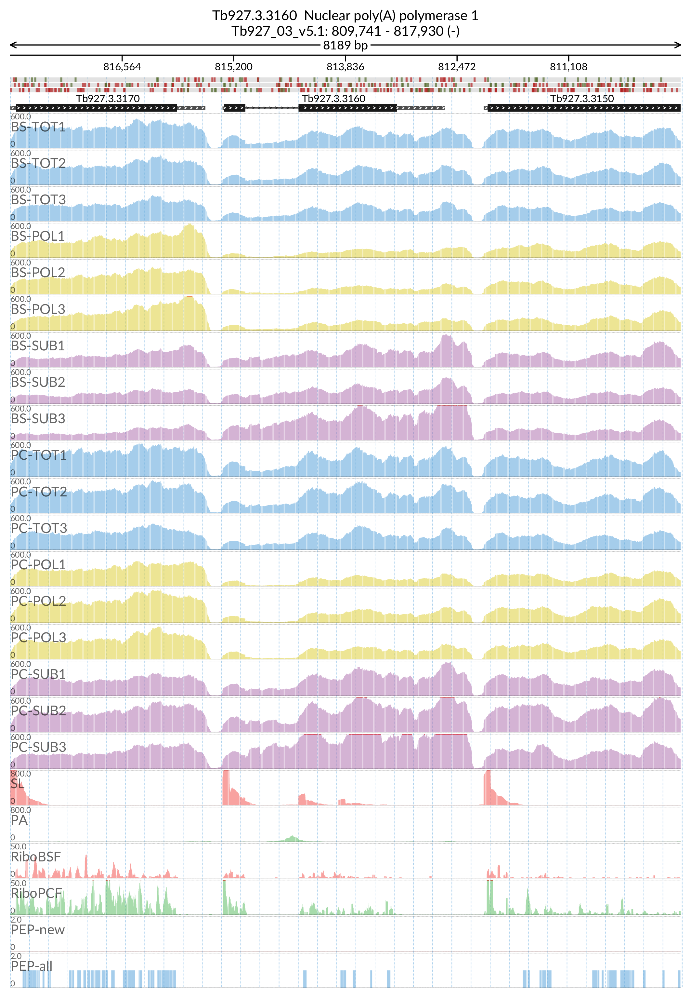

rm: cannot remove ‘/tmp/35306.1.all.q/magick-*’: No such file or directory


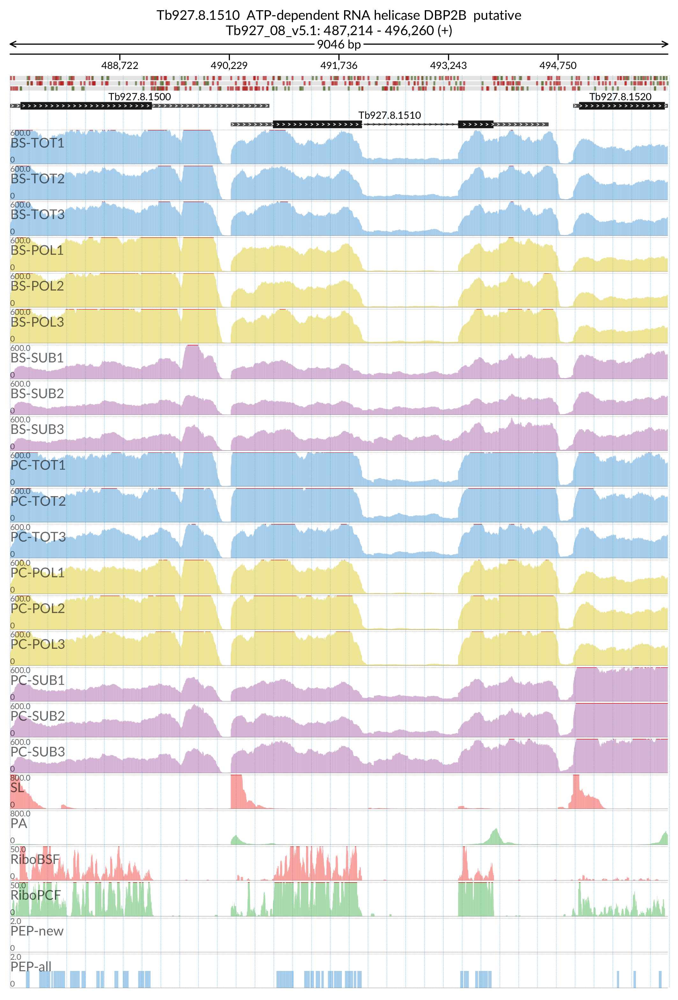

rm: cannot remove ‘/tmp/35306.1.all.q/magick-*’: No such file or directory


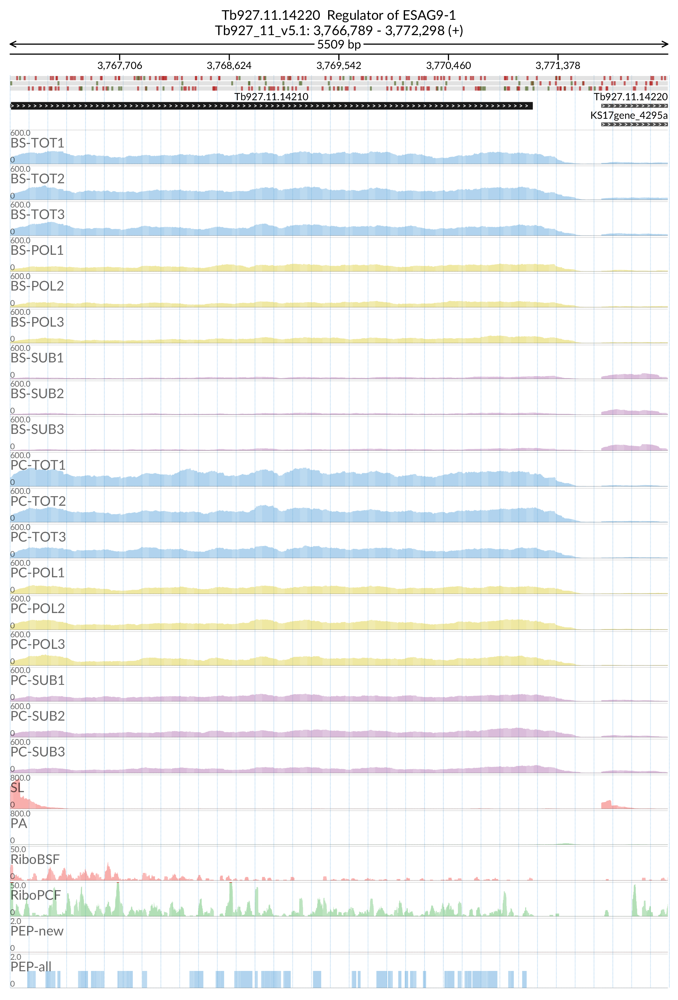

rm: cannot remove ‘/tmp/35306.1.all.q/magick-*’: No such file or directory


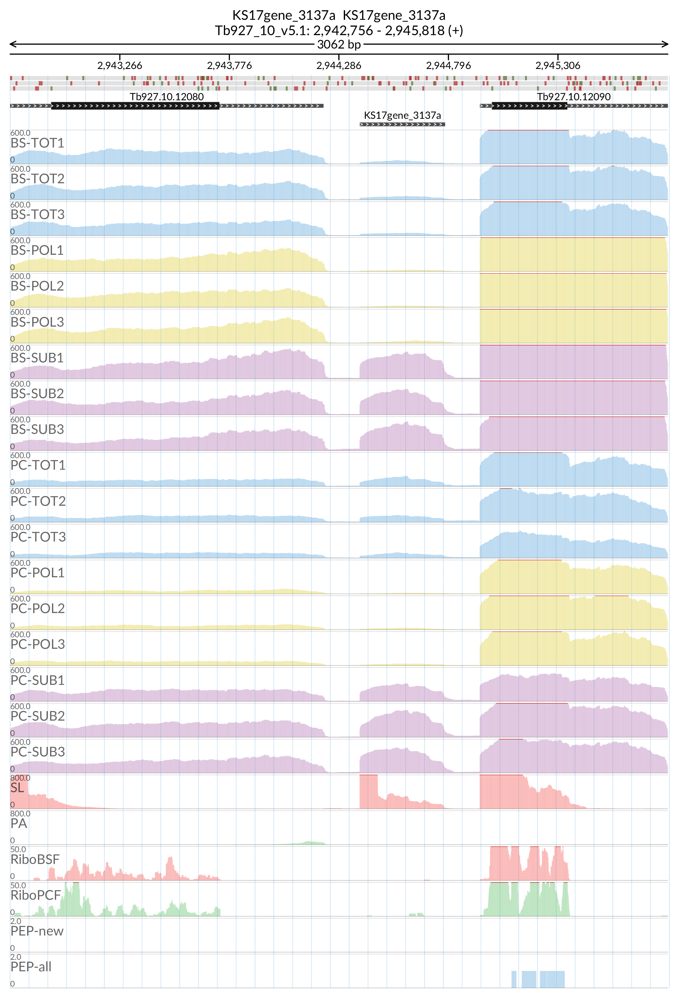

rm: cannot remove ‘/tmp/35306.1.all.q/magick-*’: No such file or directory


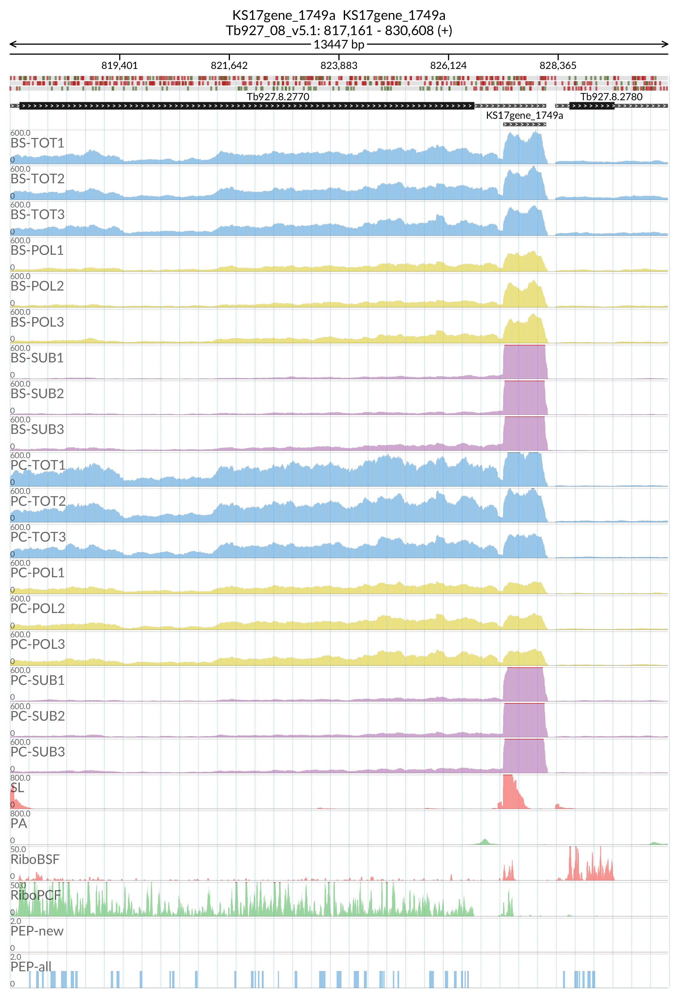

rm: cannot remove ‘/tmp/35306.1.all.q/magick-*’: No such file or directory


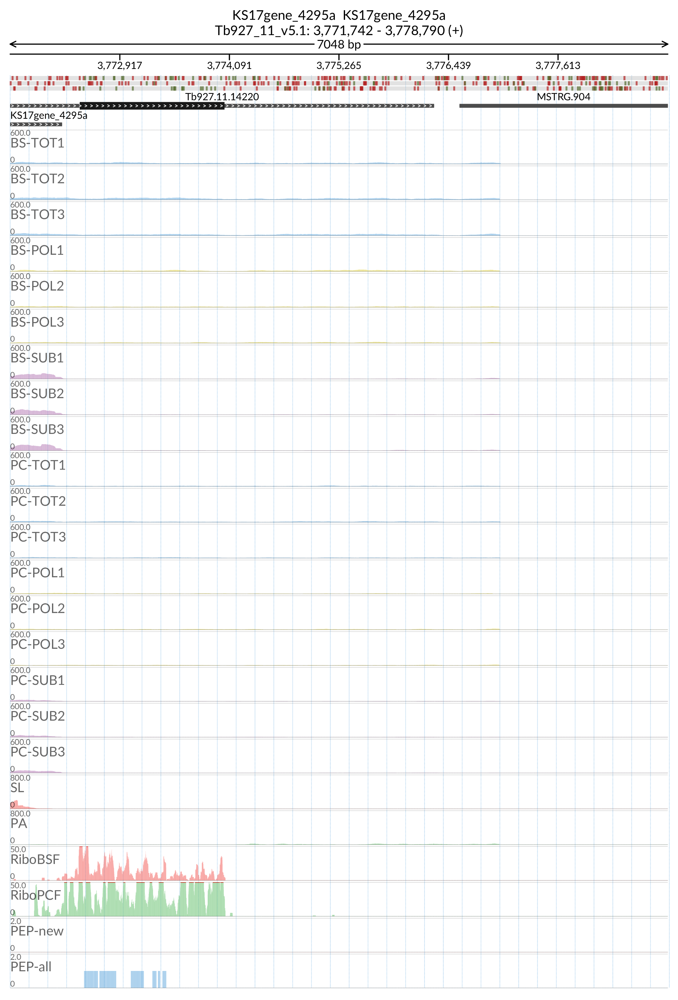

rm: cannot remove ‘/tmp/35306.1.all.q/magick-*’: No such file or directory


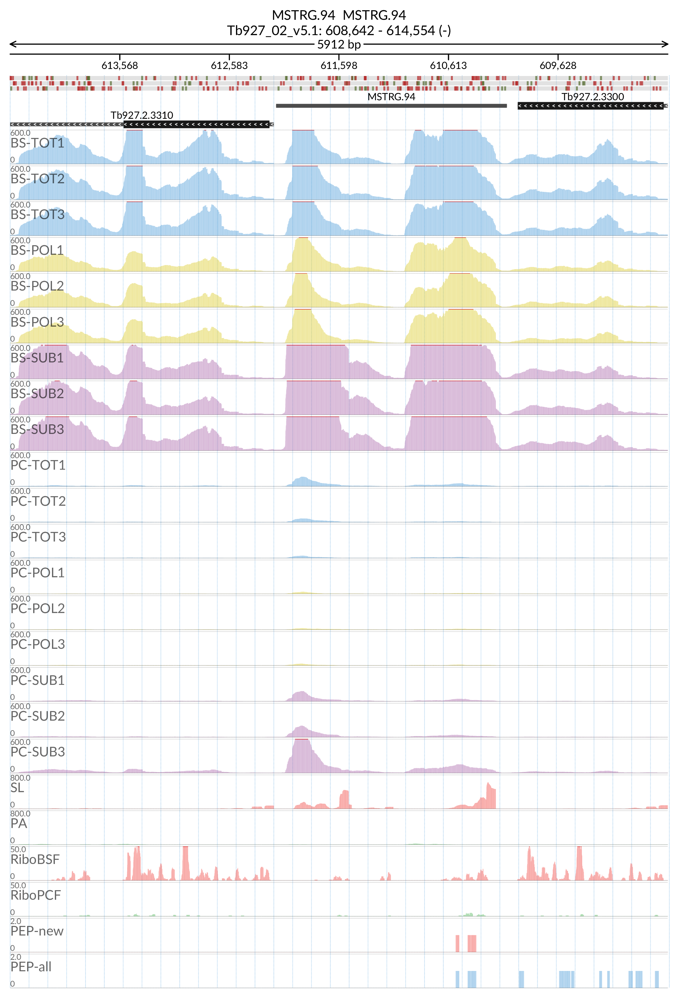

rm: cannot remove ‘/tmp/35306.1.all.q/magick-*’: No such file or directory


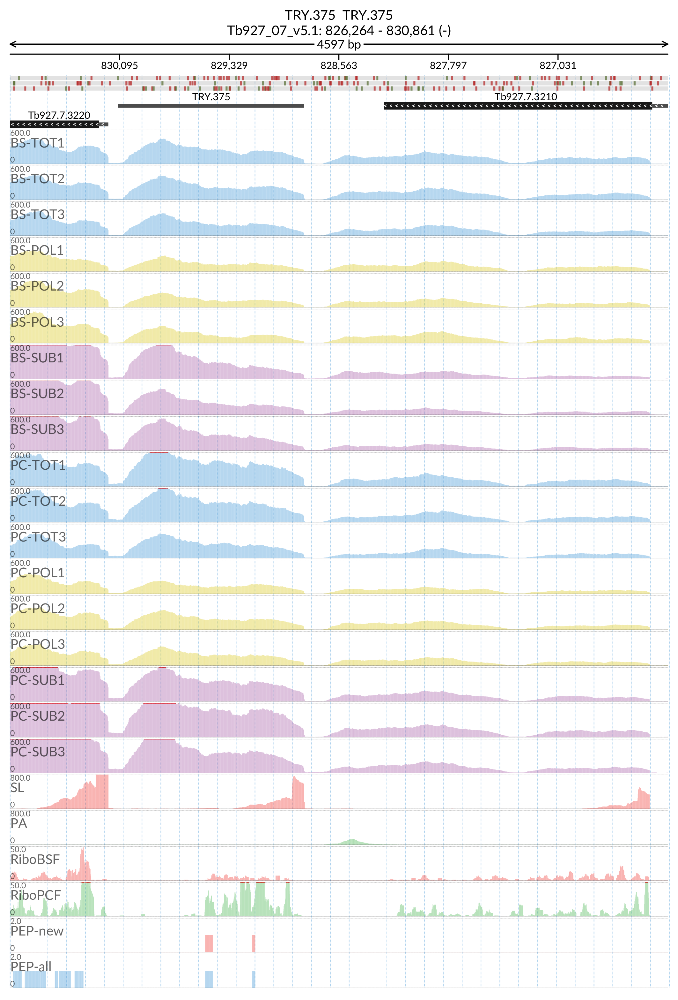

rm: cannot remove ‘/tmp/35306.1.all.q/magick-*’: No such file or directory


In [69]:
fig_out = ''
for gene in genes:#'MSTRG.94':
    limit = [600 for n in range(18)]+[800 for n in range(2)]+[50 for n in range(2)]+[2,2]
    plot_genep(gene,extend=1,max_cov='limit',limit=limit,exp='paper_figures')
   